In [1]:
!pip install xgboost

In [2]:
import numpy as np
import pandas as pd

import seaborn as sns
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split , GridSearchCV
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report , confusion_matrix , ConfusionMatrixDisplay, accuracy_score
from sklearn import tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, VotingClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.decomposition import PCA
import warnings
warnings.filterwarnings('ignore')

In [3]:
def check_shape(X_train, X_test, y_train, y_test):
  print("Shape of Data")

  print("----"*20)

  print("Training data")
  print(f"X_train: {X_train.shape}")
  print(f"y_train: {y_train.shape}")

  print("----"*20)

  print("Testing data")
  print(f"X_test: {X_test.shape}")
  print(f"y_test: {y_test.shape}")

In [4]:
train_data = pd.read_csv("/content/pendigits-tra.csv")
train_data.head()

,47,100,27,81,57,37,26,0,0.1,23,56,53,100.1,90,40,98,8
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [5]:
test_data = pd.read_csv("/content/pendigits-tes.csv")
test_data

,88,92,2,99,16,66,94,37,70,0,0.1,24,42,65,100,100.1,8
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3492,36,100,24,70,0,38,49,33,95,47,87,55,96,21,100,0,4
3493,16,75,41,100,52,64,32,27,0,0,21,9,62,2,100,14,2
3494,56,100,27,79,0,39,12,0,66,15,100,51,93,93,38,93,0
3495,19,100,0,61,3,23,48,0,97,27,100,66,62,97,10,81,0


In [6]:
col_names = ['f1', 'f2', 'f3', 'f4', 'f5', 'f6', 'f7', 'f8',
             'f9', 'f10', 'f11', 'f12', 'f13', 'f14', 'f15', 'f16', 'target']


In [7]:
train_data.columns = col_names
train_data.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,target
0,0,89,27,100,42,75,29,45,15,15,37,0,69,2,100,6,2
1,0,57,31,68,72,90,100,100,76,75,50,51,28,25,16,0,1
2,0,100,7,92,5,68,19,45,86,34,100,45,74,23,67,0,4
3,0,67,49,83,100,100,81,80,60,60,40,40,33,20,47,0,1
4,100,100,88,99,49,74,17,47,0,16,37,0,73,16,20,20,6


In [8]:
test_data.columns = col_names
test_data.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,f11,f12,f13,f14,f15,f16,target
0,80,100,18,98,60,66,100,29,42,0,0,23,42,61,56,98,8
1,0,94,9,57,20,19,7,0,20,36,70,68,100,100,18,92,8
2,95,82,71,100,27,77,77,73,100,80,93,42,56,13,0,0,9
3,68,100,6,88,47,75,87,82,85,56,100,29,75,6,0,0,9
4,70,100,100,97,70,81,45,65,30,49,20,33,0,16,0,0,1


In [9]:
train_data.isnull().sum()

,0
f1,0
f2,0
f3,0
f4,0
f5,0
f6,0
f7,0
f8,0
f9,0
f10,0


In [10]:
test_data.isnull().sum()

,0
f1,0
f2,0
f3,0
f4,0
f5,0
f6,0
f7,0
f8,0
f9,0
f10,0


In [11]:
train_data.info(), test_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7493 entries, 0 to 7492
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   f1      7493 non-null   int64
 1   f2      7493 non-null   int64
 2   f3      7493 non-null   int64
 3   f4      7493 non-null   int64
 4   f5      7493 non-null   int64
 5   f6      7493 non-null   int64
 6   f7      7493 non-null   int64
 7   f8      7493 non-null   int64
 8   f9      7493 non-null   int64
 9   f10     7493 non-null   int64
 10  f11     7493 non-null   int64
 11  f12     7493 non-null   int64
 12  f13     7493 non-null   int64
 13  f14     7493 non-null   int64
 14  f15     7493 non-null   int64
 15  f16     7493 non-null   int64
 16  target  7493 non-null   int64
dtypes: int64(17)
memory usage: 995.3 KB
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3497 entries, 0 to 3496
Data columns (total 17 columns):
 #   Column  Non-Null Count  Dtype
---  ------  --------------  -----
 0   f1   

(None, None)

In [12]:
train_data.duplicated().sum(), test_data.duplicated().sum()

(np.int64(0), np.int64(0))

In [13]:
train_data.target.value_counts(), test_data.target.value_counts()

(target
 2    780
 4    780
 0    780
 1    779
 7    778
 6    720
 5    720
 9    719
 3    719
 8    718
 Name: count, dtype: int64,
 target
 4    364
 1    364
 7    364
 2    364
 0    363
 9    336
 6    336
 3    336
 8    335
 5    335
 Name: count, dtype: int64)

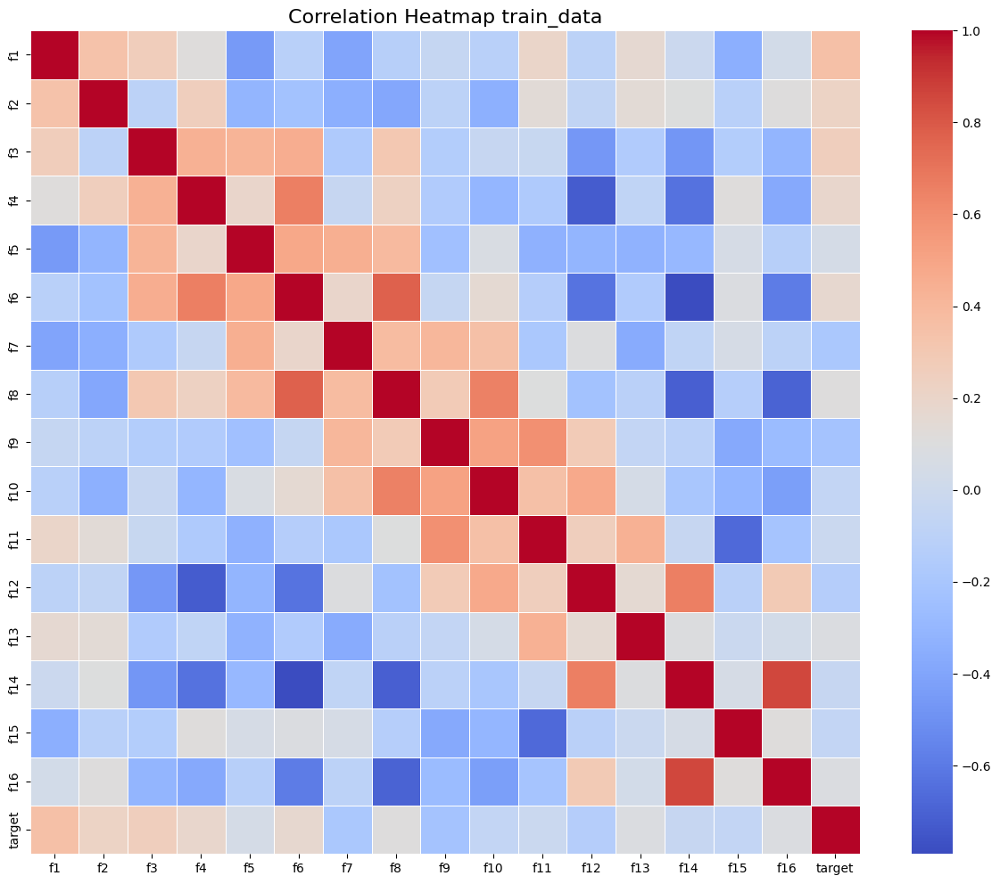

In [14]:
corr = train_data.corr()

plt.figure(figsize=(15, 12))
sns.heatmap(corr, cmap="coolwarm", annot=False, linewidths=0.5)
plt.title("Correlation Heatmap train_data", fontsize=16)
plt.show()

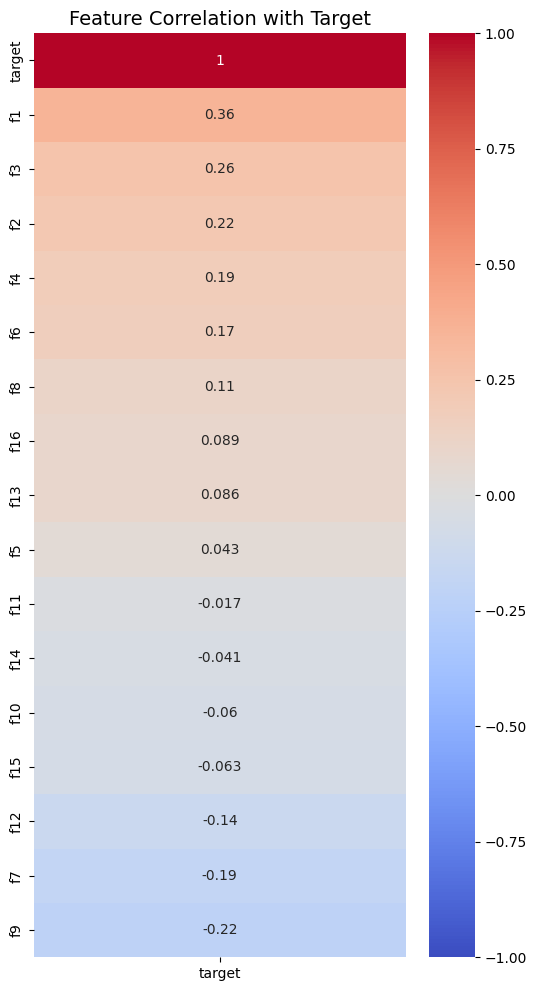

In [15]:
corr_with_target = train_data.corr()[["target"]].sort_values(by="target", ascending=False)

plt.figure(figsize=(6, 12))
sns.heatmap(corr_with_target, annot=True, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Feature Correlation with Target", fontsize=14)
plt.show()

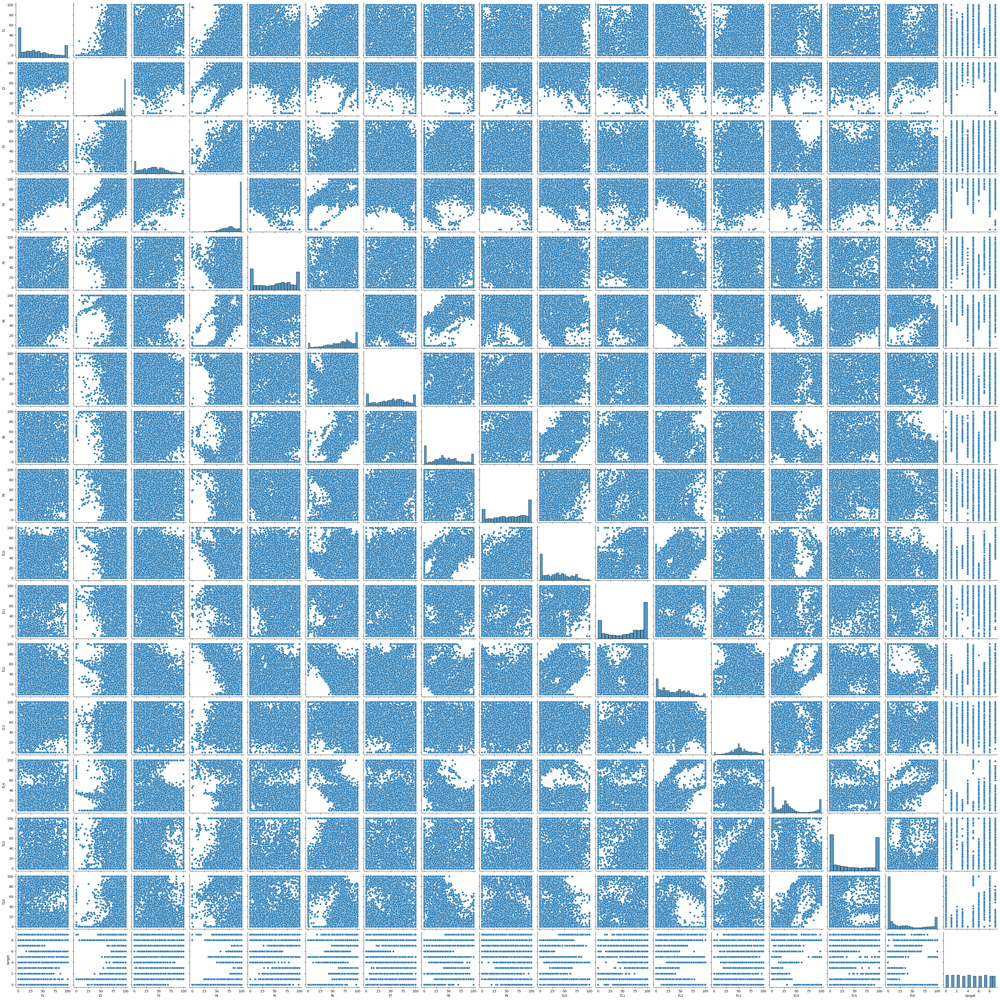

In [16]:
sns.pairplot(train_data, diag_kind='hist')
plt.show()

In [17]:
X_train = train_data.drop(['target'], axis=1)
y_train = train_data['target']

In [18]:
X_test = test_data.drop(['target'], axis=1)
y_test = test_data['target']

In [19]:
check_shape(X_train, X_test, y_train, y_test)

Shape of Data
--------------------------------------------------------------------------------
Training data
X_train: (7493, 16)
y_train: (7493,)
--------------------------------------------------------------------------------
Testing data
X_test: (3497, 16)
y_test: (3497,)


In [20]:
dt = DecisionTreeClassifier()

In [21]:
dt.fit(X_train, y_train)

DecisionTreeClassifier()

In [22]:
y_pred = dt.predict(X_test)

In [23]:
col_names[16]

'target'

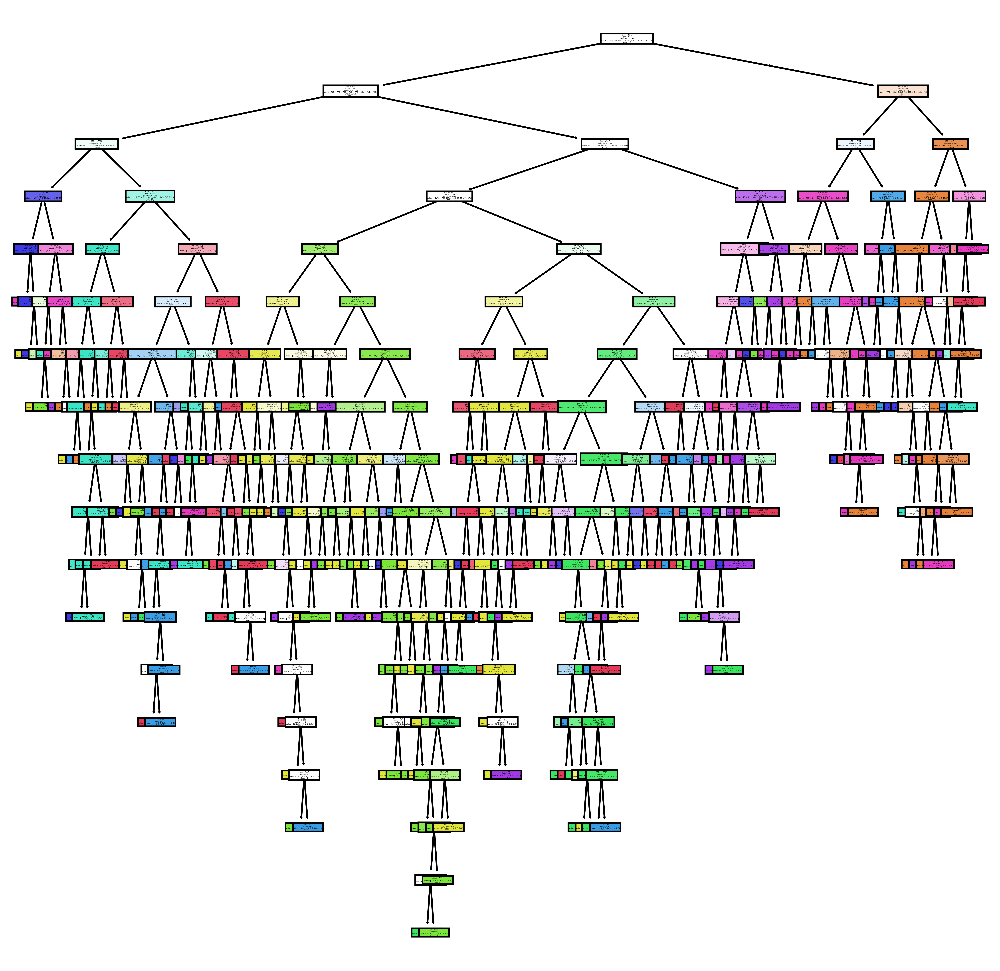

In [24]:
fig = plt.figure(figsize=(10,10), dpi=800)
class_names = [str(int(c)) for c in np.unique(y_train)]
tree.plot_tree(dt, feature_names=X_train.columns.tolist(), class_names=class_names, filled=True)
plt.show()

In [25]:
print(f"Decision Tree Accuracy ---> {accuracy_score(y_test, y_pred)}")
print(f"Decision Tree Accuracy ---> {accuracy_score(y_test, y_pred)}")

Decision Tree Accuracy ---> 0.9202173291392622
Decision Tree Accuracy ---> 0.9202173291392622


In [26]:
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")

Confusion Matrix:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96       363
           1       0.79      0.89      0.84       364
           2       0.88      0.95      0.91       364
           3       0.89      0.93      0.91       336
           4       0.98      0.97      0.97       364
           5       0.94      0.86      0.90       335
           6       0.99      0.94      0.96       336
           7       0.94      0.84      0.89       364
           8       0.92      0.95      0.94       335
           9       0.95      0.93      0.94       336

    accuracy                           0.92      3497
   macro avg       0.92      0.92      0.92      3497
weighted avg       0.92      0.92      0.92      3497

Confusion Matrix:
               precision    recall  f1-score   support

           0       0.96      0.95      0.96       363
           1       0.79      0.89      0.84       364
           2       0.88      0.95      0

In [27]:
confusion_matrix(y_test, y_pred)

array([[346,   0,   1,   0,   0,   0,   0,   2,  14,   0],
       [  0, 323,  36,   2,   1,   0,   0,   2,   0,   0],
       [  0,  14, 346,   0,   0,   2,   0,   2,   0,   0],
       [  0,  13,   2, 312,   0,   3,   0,   3,   0,   3],
       [  0,   1,   2,   1, 353,   3,   2,   0,   0,   2],
       [  0,   0,   1,  25,   4, 287,   0,   2,   4,  12],
       [  9,   4,   1,   0,   0,   4, 315,   0,   3,   0],
       [  0,  42,   4,   9,   0,   0,   1, 306,   2,   0],
       [  5,   1,   0,   0,   1,   3,   1,   6, 317,   1],
       [  0,   9,   0,   3,   3,   2,   0,   3,   3, 313]])

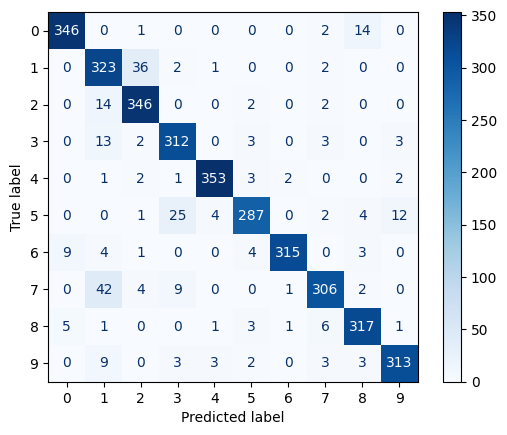

In [28]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap='Blues')
plt.show()

In [29]:
clf = DecisionTreeClassifier(random_state=42)
path = clf.cost_complexity_pruning_path(X_train, y_train)
ccp_alphas, impurities = path.ccp_alphas, path.impurities

Text(0.5, 1.0, 'Total Impurity vs effective alpha for training set')

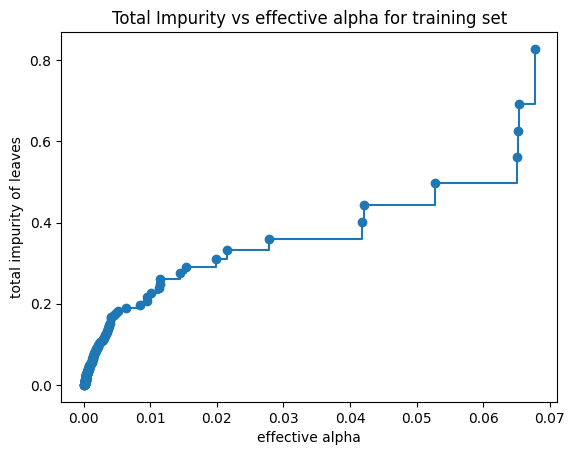

In [30]:
fig, ax = plt.subplots()
ax.plot(ccp_alphas[:-1], impurities[:-1], marker="o", drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")

In [31]:
clfs = []
for ccp_alpha in ccp_alphas:
    clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    clf.fit(X_train, y_train)
    clfs.append(clf)
print(
    "Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
        clfs[-1].tree_.node_count, ccp_alphas[-1]
    )
)

Number of nodes in the last tree is: 1 with ccp_alpha: 0.07217581441847953


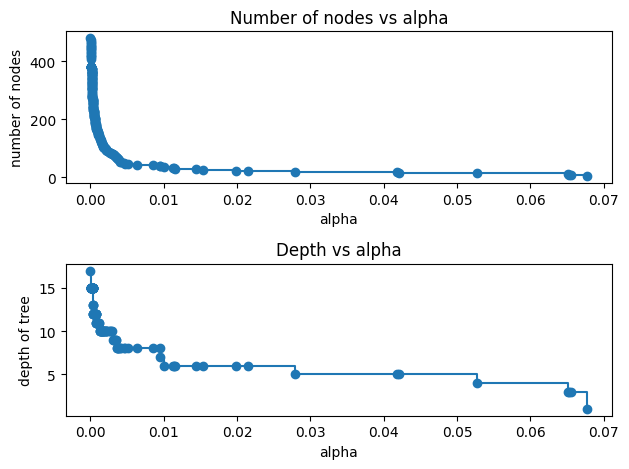

In [32]:
clfs = clfs[:-1]
ccp_alphas = ccp_alphas[:-1]

node_counts = [clf.tree_.node_count for clf in clfs]
depth = [clf.tree_.max_depth for clf in clfs]
fig, ax = plt.subplots(2, 1)
ax[0].plot(ccp_alphas, node_counts, marker="o", drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker="o", drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

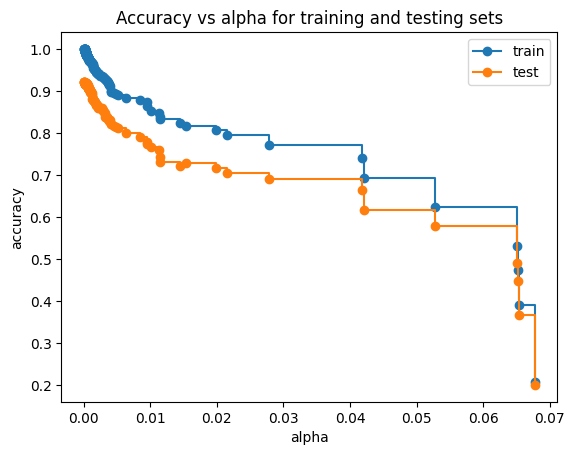

In [33]:
train_scores = [clf.score(X_train, y_train) for clf in clfs]
test_scores = [clf.score(X_test, y_test) for clf in clfs]

fig, ax = plt.subplots()
ax.set_xlabel("alpha")
ax.set_ylabel("accuracy")
ax.set_title("Accuracy vs alpha for training and testing sets")
ax.plot(ccp_alphas, train_scores, marker="o", label="train", drawstyle="steps-post")
ax.plot(ccp_alphas, test_scores, marker="o", label="test", drawstyle="steps-post")
ax.legend()
plt.show()

In [34]:
tree_bag = BaggingClassifier(estimator=DecisionTreeClassifier(), n_estimators=50, random_state=42)
svm_bag = BaggingClassifier(estimator=SVC(probability=True), n_estimators=50, random_state=42)


In [35]:
voting_ensemble = VotingClassifier(
    estimators=[('bag_tree', tree_bag), ('bag_svm', svm_bag)],
    voting='soft'
)

In [36]:
voting_ensemble.fit(X_train, y_train)

VotingClassifier(estimators=[('bag_tree',
                              BaggingClassifier(estimator=DecisionTreeClassifier(),
                                                n_estimators=50,
                                                random_state=42)),
                             ('bag_svm',
                              BaggingClassifier(estimator=SVC(probability=True),
                                                n_estimators=50,
                                                random_state=42))],
                 voting='soft')

In [37]:
y_pred = voting_ensemble.predict(X_test)
print(f"Decision Tree Accuracy ---> {accuracy_score(y_test, y_pred)}")


Decision Tree Accuracy ---> 0.9791249642550758


In [38]:
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")


Confusion Matrix:
               precision    recall  f1-score   support

           0       0.99      0.97      0.98       363
           1       0.94      0.95      0.94       364
           2       0.96      1.00      0.98       364
           3       0.98      0.99      0.98       336
           4       1.00      0.98      0.99       364
           5       0.99      0.98      0.98       335
           6       1.00      1.00      1.00       336
           7       0.99      0.95      0.97       364
           8       0.97      0.99      0.98       335
           9       0.99      0.99      0.99       336

    accuracy                           0.98      3497
   macro avg       0.98      0.98      0.98      3497
weighted avg       0.98      0.98      0.98      3497



In [39]:
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred = rf.predict(X_test)
print(f"Decision Tree Accuracy ---> {accuracy_score(y_test, y_pred)}")
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")


Decision Tree Accuracy ---> 0.9645410351730054
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.96      0.98       363
           1       0.91      0.91      0.91       364
           2       0.91      0.98      0.95       364
           3       0.98      0.99      0.98       336
           4       1.00      1.00      1.00       364
           5       1.00      0.95      0.97       335
           6       1.00      1.00      1.00       336
           7       0.98      0.89      0.94       364
           8       0.95      1.00      0.98       335
           9       0.94      0.99      0.96       336

    accuracy                           0.96      3497
   macro avg       0.97      0.97      0.96      3497
weighted avg       0.97      0.96      0.96      3497



In [40]:
acc_scores = []
models = []

for i in range(5):
  rf = RandomForestClassifier(n_estimators=(10 + i * 38))
  models.append(rf)

  models[i].fit(X_train, y_train)
  y_pred = models[i].predict(X_test)
  acc_scores.append(accuracy_score(y_pred=y_pred, y_true=y_test) * 100)
  print(f'"model[{i}] accuracy scores"')
  print(f"val_acc_score: {acc_scores[i]}%")
  print("----"*20)


"model[0] accuracy scores"
val_acc_score: 95.6534172147555%
--------------------------------------------------------------------------------
"model[1] accuracy scores"
val_acc_score: 96.51129539605377%
--------------------------------------------------------------------------------
"model[2] accuracy scores"
val_acc_score: 96.48269945667715%
--------------------------------------------------------------------------------
"model[3] accuracy scores"
val_acc_score: 96.39691163854732%
--------------------------------------------------------------------------------
"model[4] accuracy scores"
val_acc_score: 96.45410351730054%
--------------------------------------------------------------------------------


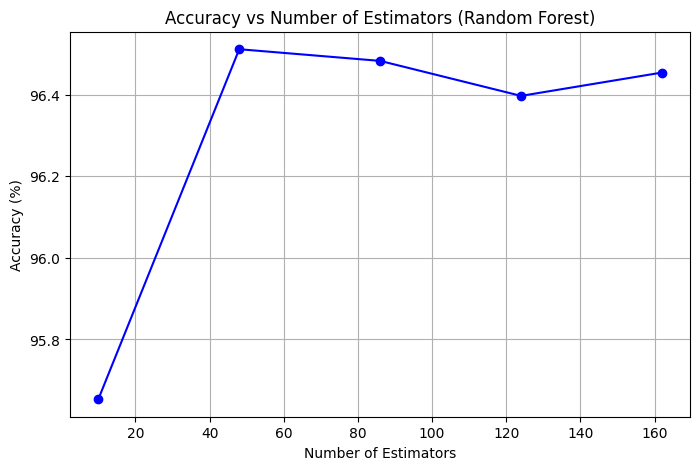

In [41]:
n_estimators_list = [10 + i * 38 for i in range(5)]

plt.figure(figsize=(8, 5))
plt.plot(n_estimators_list, acc_scores, marker='o', linestyle='-', color='b')
plt.title("Accuracy vs Number of Estimators (Random Forest)")
plt.xlabel("Number of Estimators")
plt.ylabel("Accuracy (%)")
plt.grid(True)
plt.show()

In [42]:
n_estimators_list = [10, 75, 150, 200]
lr = 0.1
best_acc = 0
best_n = None

In [43]:
for n in n_estimators_list:
    gb = GradientBoostingClassifier(n_estimators=n, learning_rate=lr, random_state=42)
    gb.fit(X_train, y_train)
    y_pred = gb.predict(X_test)
    acc = accuracy_score(y_test, y_pred) * 100
    print(f"n_estimators={n}, accuracy={acc:.2f}%")

    if acc > best_acc:
        best_acc = acc
        best_n = n

print(f"\nBest n_estimators = {best_n} with accuracy = {best_acc:.2f}%")

n_estimators=10, accuracy=87.30%
n_estimators=75, accuracy=95.91%
n_estimators=150, accuracy=96.48%
n_estimators=200, accuracy=96.57%

Best n_estimators = 200 with accuracy = 96.57%


In [44]:
learning_rates = [0.1, 0.3, 0.6, 0.9]
best_lr = None
best_acc = 0

In [45]:
for lr in learning_rates:
    gb = GradientBoostingClassifier(n_estimators=best_n, learning_rate=lr, random_state=42)
    gb.fit(X_train, y_train)
    y_pred = gb.predict(X_test)
    acc = accuracy_score(y_test, y_pred) * 100
    print(f"learning_rate={lr}, accuracy={acc:.2f}%")

    if acc > best_acc:
        best_acc = acc
        best_lr = lr

print(f"\nBest learning_rate = {best_lr} with accuracy = {best_acc:.2f}%")

learning_rate=0.1, accuracy=96.57%
learning_rate=0.3, accuracy=96.54%
learning_rate=0.6, accuracy=10.38%
learning_rate=0.9, accuracy=19.70%

Best learning_rate = 0.1 with accuracy = 96.57%


In [46]:
gb = GradientBoostingClassifier(n_estimators=200, learning_rate=0.1, random_state=42)

In [47]:
gb.fit(X_train, y_train)
y_pred = gb.predict(X_test)
acc = accuracy_score(y_test, y_pred) * 100
print(f"gradient boosting accuracy = {acc:.2f}%")
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")

gradient boosting accuracy = 96.57%
Confusion Matrix:
               precision    recall  f1-score   support

           0       1.00      0.94      0.97       363
           1       0.91      0.95      0.93       364
           2       0.95      0.99      0.97       364
           3       0.97      0.99      0.98       336
           4       1.00      1.00      1.00       364
           5       0.99      0.93      0.96       335
           6       1.00      1.00      1.00       336
           7       0.99      0.90      0.94       364
           8       0.93      1.00      0.96       335
           9       0.93      0.96      0.95       336

    accuracy                           0.97      3497
   macro avg       0.97      0.97      0.97      3497
weighted avg       0.97      0.97      0.97      3497



In [48]:
xgb = XGBClassifier(n_estimators=200, lr=0.1)
xgb.fit(X_train, y_train)
y_pred = xgb.predict(X_test)

In [49]:
print(f"XGB accuracy = {acc:.2f}%")
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")

XGB accuracy = 96.57%
Confusion Matrix:
               precision    recall  f1-score   support

           0       0.99      0.94      0.97       363
           1       0.92      0.95      0.93       364
           2       0.94      0.99      0.97       364
           3       0.97      0.99      0.98       336
           4       0.96      0.99      0.98       364
           5       0.99      0.96      0.97       335
           6       1.00      0.99      0.99       336
           7       0.98      0.89      0.94       364
           8       0.94      0.99      0.96       335
           9       0.98      0.96      0.97       336

    accuracy                           0.97      3497
   macro avg       0.97      0.97      0.97      3497
weighted avg       0.97      0.97      0.97      3497



In [50]:
pca = PCA(n_components=2)

In [53]:
X_train_reduced = pca.fit_transform(X_train)
X_test_reduced = pca.transform(X_test)

In [54]:
voting_ensemble.fit(X_train_reduced,
                    y_train)
y_pred = voting_ensemble.predict(X_test_reduced)
print(f"Decision Tree Accuracy ---> {accuracy_score(y_test, y_pred)}")

Decision Tree Accuracy ---> 0.7037460680583357


In [55]:
print(f"Confusion Matrix:\n {classification_report(y_test, y_pred)}")

Confusion Matrix:
               precision    recall  f1-score   support

           0       0.91      0.82      0.86       363
           1       0.56      0.43      0.49       364
           2       0.56      0.69      0.62       364
           3       0.72      0.82      0.77       336
           4       0.79      0.75      0.77       364
           5       0.88      0.55      0.67       335
           6       0.71      0.65      0.68       336
           7       0.59      0.57      0.58       364
           8       0.71      0.85      0.78       335
           9       0.71      0.92      0.80       336

    accuracy                           0.70      3497
   macro avg       0.71      0.71      0.70      3497
weighted avg       0.71      0.70      0.70      3497

